## Paralleldots | Data Scientist Assignment

### Name : Suryavijoy Kar
### email : suryavijoykar13@gmail.com
### phone : +91 8011705468

Download dataset from http://www.cs.cmu.edu/~ehsiao/3drecognition/CMU10_3D.zip. Copy data_2D folder from CMU10_3D.zip\CMU10_3D\data_2D to same directory as the notebook.

### Import necessary libraries

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
import matplotlib.patches as patches
import os,glob,shutil

from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.build_sam import build_sam2_video_predictor

D:\DSA\extra\Paralleldots\segment-anything-2\sam2\modeling\sam\transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


### Set-up

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [3]:
# set up SAM2 mask generator
checkpoint = "./sam2_hiera_tiny.pt"
model_cfg = "sam2_hiera_t.yaml"
predictor_prompt = SAM2ImagePredictor(build_sam2(model_cfg, checkpoint))
sam2 = build_sam2(model_cfg, checkpoint, device='cuda', apply_postprocessing=False)
mask_generator = SAM2AutomaticMaskGenerator(sam2)
predictor_vid = build_sam2_video_predictor(model_cfg, checkpoint, device=device)

tempfolder = "./tempdir"

### Helper functions

In [4]:
def create_if_not_exists(dirname):
    if not os.path.exists(dirname):
        os.mkdir(dirname)

def cleardir(tempfolder):
    filepaths = glob.glob(tempfolder+"/*")
    for filepath in filepaths:
        os.unlink(filepath)

def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1,-1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2]- box[0], box[3]- box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 255)))

def track_item_boxes(imgpath1,imgpath2,img1boxclasslist,visualize=True):
    # imgpath1 :: Image where object is known
    # imgpath2 :: Image where object is to be tracked
    # img1boxclasslist :: [ ([xmin,xmax,ymin,ymax],objectnumint) ,....] for all objects in imagepath1
    create_if_not_exists(tempfolder)
    cleardir(tempfolder)
    shutil.copy(imgpath1,tempfolder+"/00000.jpg");
    shutil.copy(imgpath2,tempfolder+"/00001.jpg");
    inference_state = predictor_vid.init_state(video_path="./tempdir");
    predictor_vid.reset_state(inference_state);
    ann_frame_idx = 0
    for img1boxclass in img1boxclasslist:
        ([xmin,xmax,ymin,ymax],objectnumint) = img1boxclass;
        box = np.array([xmin, ymin, xmax, ymax], dtype=np.float32);
        _, out_obj_ids, out_mask_logits = predictor_vid.add_new_points_or_box(
            inference_state=inference_state,
            frame_idx=ann_frame_idx,
            obj_id=objectnumint,
            box=box,
            );
    video_segments = {} # video_segments contains the per-frame segmentation results
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor_vid.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        };
    if visualize:
        fig, ax = plt.subplots()
        plt.title(f"original image object ::")
        ax.imshow(Image.open(tempfolder+"/00000.jpg"))
        rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1, edgecolor='r',fill=0)
        ax.add_patch(rect)
        plt.show()
        out_frame_idx = 1
        plt.figure(figsize=(6, 4))
        plt.title(f"detected object in test image ::")
        plt.imshow(Image.open(tempfolder+"/00001.jpg"))
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
    return video_segments;

In [5]:
# extracts the bounding boxes from the mask and visualises the images
def process_img_png_mask(image_path,mask_path,visualise=True):
    mask_cv = cv2.imread(mask_path)
    imgray = cv2.cvtColor(mask_cv, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 127, 255, 0)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = cv2.boundingRect(contours[0])

    if visualise==True:
        image = Image.open(image_path)
        image = np.array(image.convert("RGB"))
        plt.figure(figsize=(6, 4))
        plt.imshow(image)
        plt.title("full image")
        plt.axis('on')
        plt.show()

        mask = Image.open(mask_path)
        mask = np.array(mask.convert("RGB"))
        plt.figure(figsize=(6, 4))
        plt.imshow(mask)
        plt.title('mask')
        plt.axis('on')
        plt.show()

        # cv2.drawContours(image=mask_cv, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA);
        # cv2.rectangle(mask_cv,(x,y),(x+w,y+h),(0,0,255),2)
        # plt.figure(figsize=(6, 4))
        # plt.imshow(mask_cv)
        # plt.axis('on')
        # plt.show()

        # fig, ax = plt.subplots()
        # plt.title('rectangle')
        # ax.imshow(mask_cv)
        # rect = patches.Rectangle((x,y),w,h,linewidth=2,ec='r',fill=0)
        # ax.add_patch(rect)
        # plt.axis('on')
        # plt.show()
        
        plt.figure(figsize=(6, 4))
        plt.imshow(image[y:y+h,x:x+w])
        plt.title('extracted')
        plt.axis('on')
        plt.show()

    return [x,x+w,y,y+h]

In [6]:
# extracts the bounding boxes from the predicted mask by SAM2
def bbox_from_rel_mask(tempfolder,relevant_mask):
    create_if_not_exists(tempfolder)
    cleardir(tempfolder)
    cv2.imwrite(os.path.join(tempfolder,'temp.png'),relevant_mask*255)
    rel_mask_cv = cv2.imread(os.path.join(tempfolder,'temp.png'))
    imgray = cv2.cvtColor(rel_mask_cv, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(imgray, 127, 255, 0)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = cv2.boundingRect(contours[0])
    return [x,x+w,y,y+h]

In [7]:
# calculates the Intersection over Union performance metric for ground truth bounding box 
# and predicted bounding box
def calc_iou_from_bbox(box1,box2):
    # Determine the coordinates of the intersection rectangle
    x1 = max(box1[0], box2[0])
    x2 = min(box1[1], box2[1])
    y1 = max(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of intersection rectangle
    interArea = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)

    # Compute the area of both the prediction and ground-truth rectangles
    box1Area = (box1[1] - box1[0] + 1) * (box1[3] - box1[2] + 1)
    box2Area = (box2[1] - box2[0] + 1) * (box2[3] - box2[2] + 1)

    # Compute the intersection over union
    iou = interArea / float(box1Area + box2Area - interArea)

    return iou

In [8]:
# prints the IOU metrics for any object class and test image and visualises the results
def final_output(object_type,test_idx,visualise=True):
    ref_img_path = f'./data_2D/{object_type}_{str(1).zfill(6)}.jpg'
    ref_img_mask_path = f'./data_2D/{object_type}_{str(1).zfill(6)}_1_gt.png'

    test_img_path = f'./data_2D/{object_type}_{str(test_idx).zfill(6)}.jpg'
    gt_mask_path = f'./data_2D/{object_type}_{str(test_idx).zfill(6)}_1_gt.png'

    [xmin,xmax,ymin,ymax] = process_img_png_mask(ref_img_path,ref_img_mask_path,visualise=False);

    op = track_item_boxes(ref_img_path,test_img_path,[([xmin,xmax,ymin,ymax],1)],visualize=False);
    output_masks = op[1]
    relevant_mask = output_masks[1]
    relevant_mask = np.array(relevant_mask[0,:,:])

    if visualise==True:
        # refrence image plots
        fig,axs = plt.subplots(1,2,figsize=(14,6))
        fig.suptitle(f'Reference image and mask : {object_type}_{str(1).zfill(6)}')

        ref_image = Image.open(ref_img_path)
        ref_image = np.array(ref_image.convert("RGB"))
        axs[0].imshow(ref_image)
        axs[0].set_title(f'Reference Image : {object_type}_{str(1).zfill(6)}.jpg')
        
        gt_mask = Image.open(ref_img_mask_path)
        gt_mask = np.array(gt_mask.convert("RGB"))
        axs[1].imshow(gt_mask)
        axs[1].set_title(f'Reference Image Mask : {object_type}_{str(1).zfill(6)}_1_gt.png')

        fig.tight_layout()
        plt.show()


        # test image and detected object
        fig,axs = plt.subplots(1,2,figsize=(14,6))
        fig.suptitle(f'Test image and predicted mask : {object_type}_{str(test_idx).zfill(6)}')

        test_image = Image.open(test_img_path)
        test_image = np.array(test_image.convert("RGB"))
        axs[0].imshow(test_image)
        axs[0].set_title(f'Test Image : {object_type}_{str(test_idx).zfill(6)}.jpg')
        
        axs[1].imshow(test_image)
        show_mask(output_masks[1],axs[1],1)
        axs[1].set_title('Detected object in test image')

        fig.tight_layout()
        plt.show()


        # mask plots
        fig,axs = plt.subplots(1,2,figsize=(14,6))
        fig.suptitle(f'Ground truth mask and predicted mask : {object_type}_{str(test_idx).zfill(6)}')

        gt_mask = Image.open(gt_mask_path)
        gt_mask = np.array(gt_mask.convert("RGB"))
        axs[0].imshow(gt_mask)
        axs[0].set_title(f'Ground Truth Mask : {object_type}_{str(test_idx).zfill(6)}_1_gt.png')
        
        axs[1].imshow(relevant_mask*255)
        axs[1].set_title('Predicted mask')

        fig.tight_layout()
        plt.show()
    

    det_box = bbox_from_rel_mask('./tempdir',relevant_mask)

    gt_box = process_img_png_mask(None,gt_mask_path,False)

    print(f'{object_type}_{test_idx} has IOU : {calc_iou_from_bbox(gt_box,det_box)}')

### Visualise the images

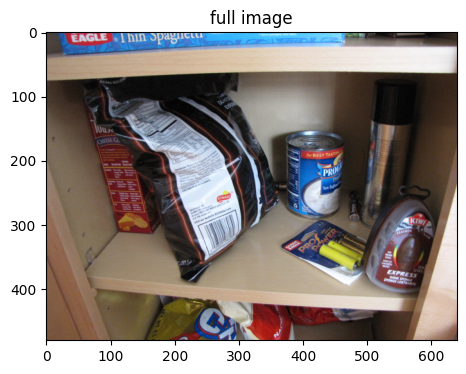

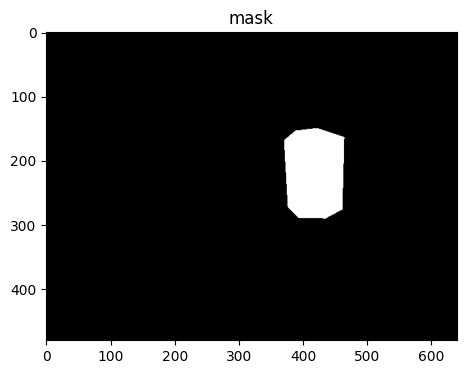

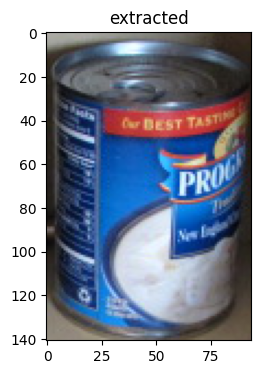

In [9]:
# visualising the reference images, reference mask and extracted item
first_img_path = './data_2D/can_chowder_000001.jpg'
mask_path = './data_2D/can_chowder_000001_1_gt.png'

[xmin,xmax,ymin,ymax] = process_img_png_mask(first_img_path,mask_path,visualise=True)

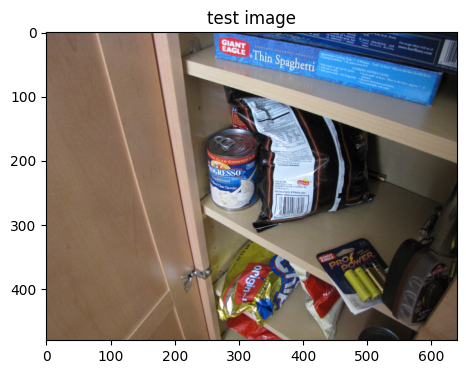

frame loading (JPEG): 100%|██████████| 2/2 [00:00<00:00, 19.79it/s]
D:\DSA\extra\Paralleldots\segment-anything-2\sam2\modeling\backbones\hieradet.py:68: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  x = F.scaled_dot_product_attention(
D:\DSA\extra\Paralleldots\segment-anything-2\sam2\sam2_video_predictor.py:873: UserWarning: cannot import name '_C' from 'sam2' (D:\DSA\extra\Paralleldots\segment-anything-2\sam2\__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/segment-anything-2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s]


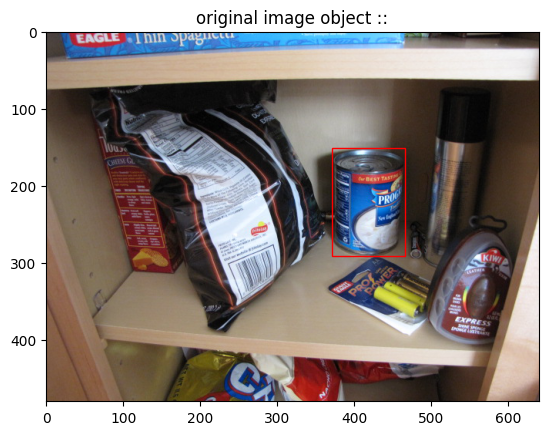

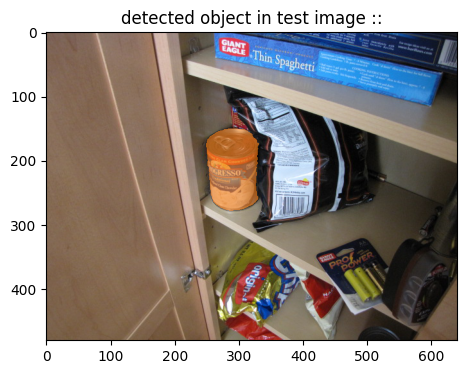

In [10]:
# visualise the test image for which we want to generate mask
second_img_path = './data_2D/can_chowder_000002.jpg'
second_img_mask_path = './data_2D/can_chowder_000002_1_gt.png'

second_img = Image.open(second_img_path)
plt.figure(figsize=(6, 4))
plt.imshow(second_img)
plt.title('test image')
plt.show()

# extract mask from test image using SAM2 and visualise the output
op = track_item_boxes(first_img_path,second_img_path,[([xmin,xmax,ymin,ymax],1)],visualize=True);

output_masks = op[1]
relevant_mask = output_masks[1]
relevant_mask = np.array(relevant_mask[0,:,:])

### Final output and performance metric for each product

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s]


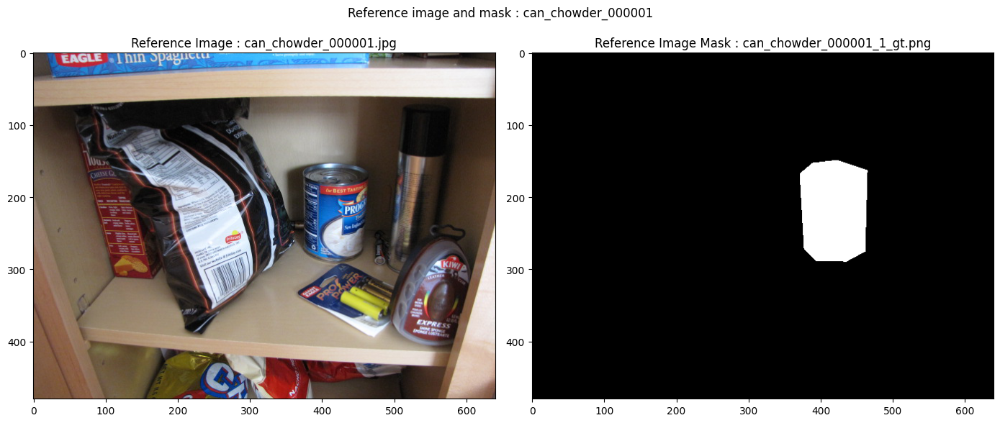

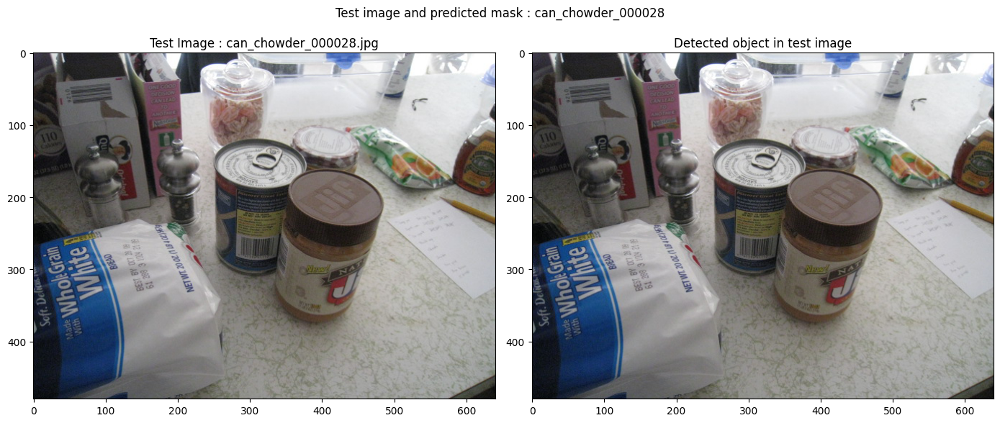

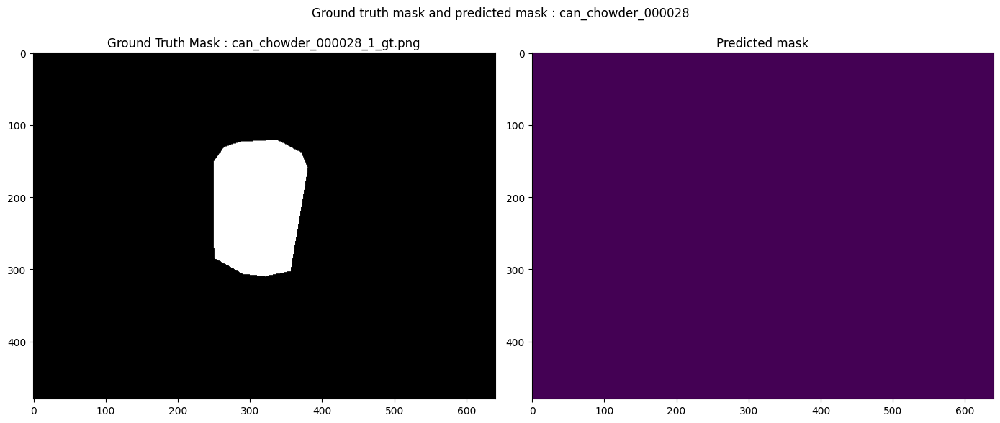

Could not detect object in test image.


In [11]:
# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'can_chowder'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s]


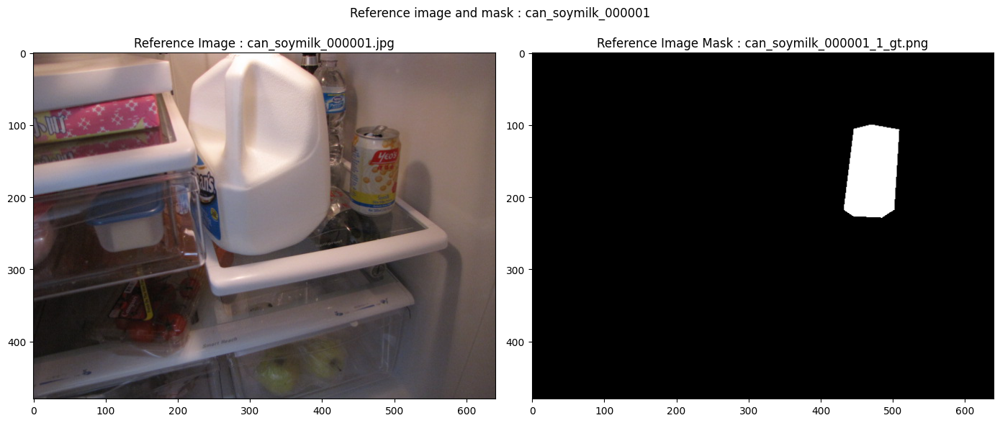

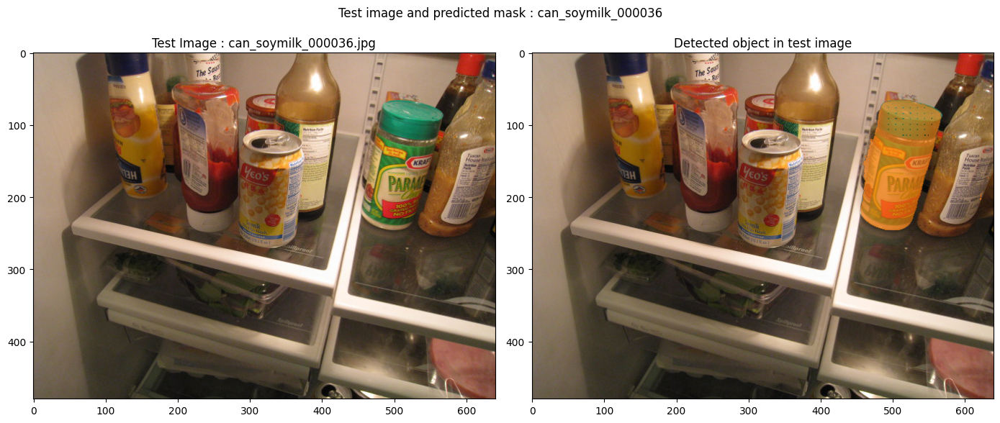

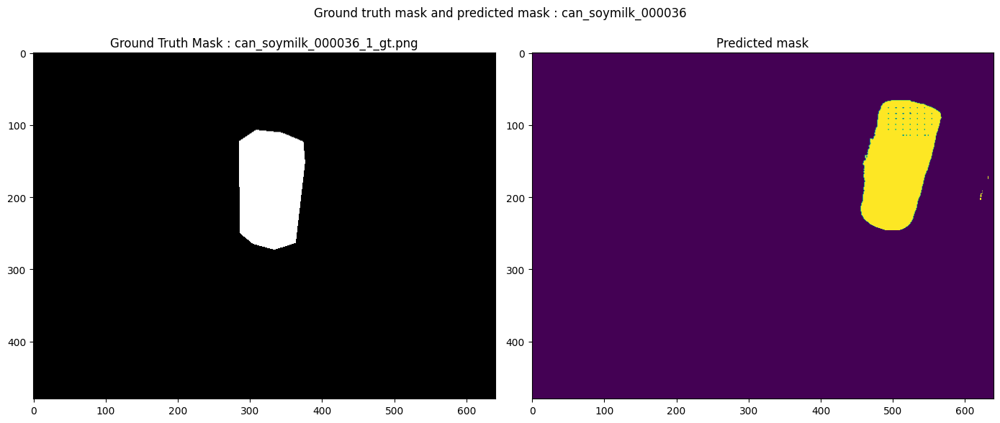

can_soymilk_36 has IOU : 0.0


In [12]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'can_soymilk'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s]


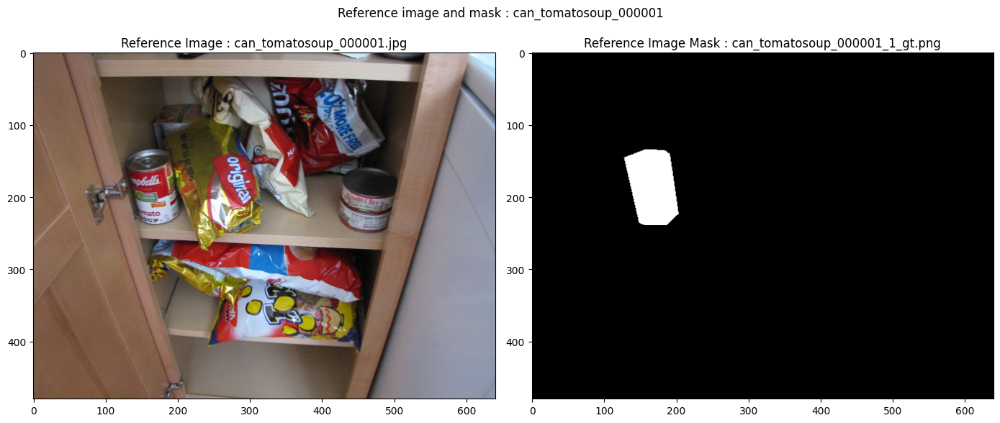

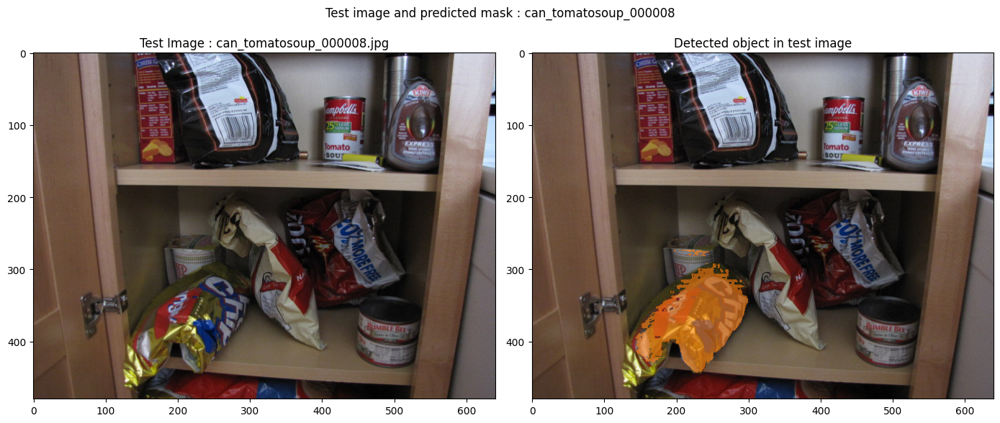

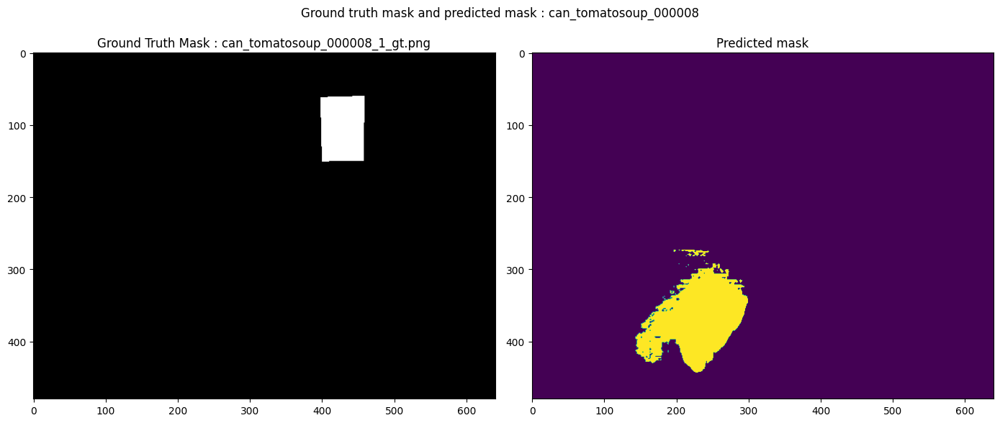

can_tomatosoup_8 has IOU : 0.0


In [13]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'can_tomatosoup'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.75it/s]


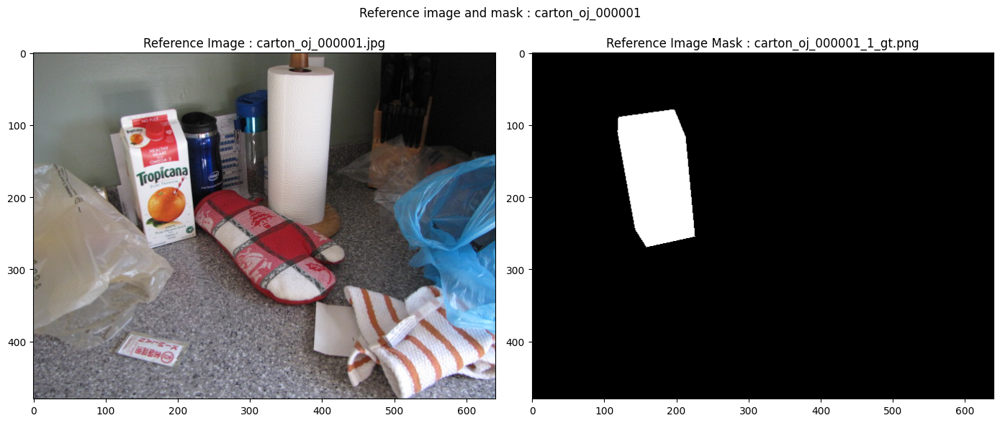

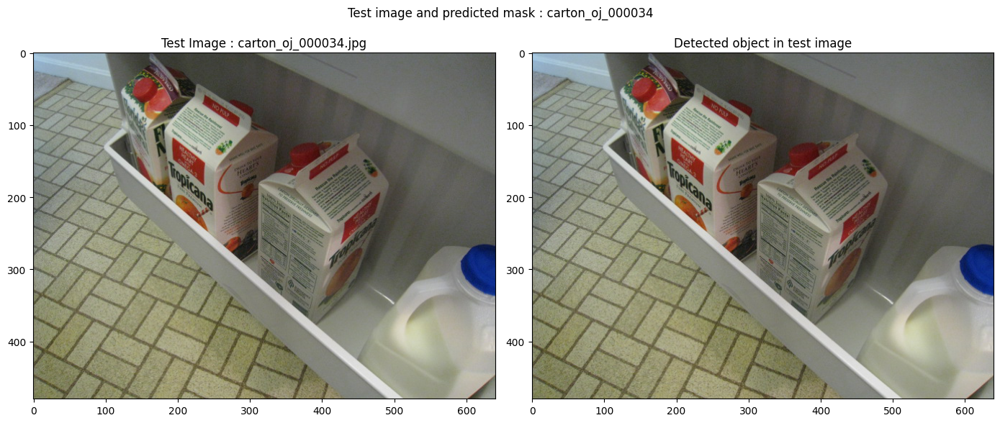

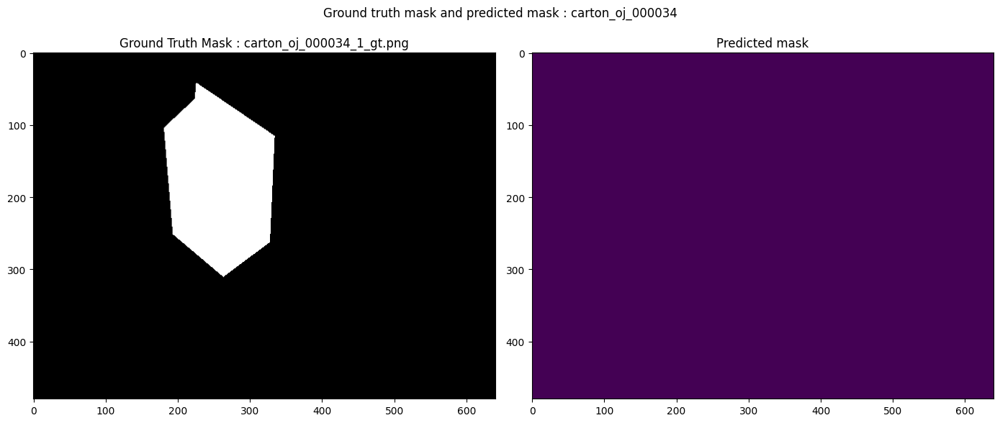

Could not detect object in test image.


In [14]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'carton_oj'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s]


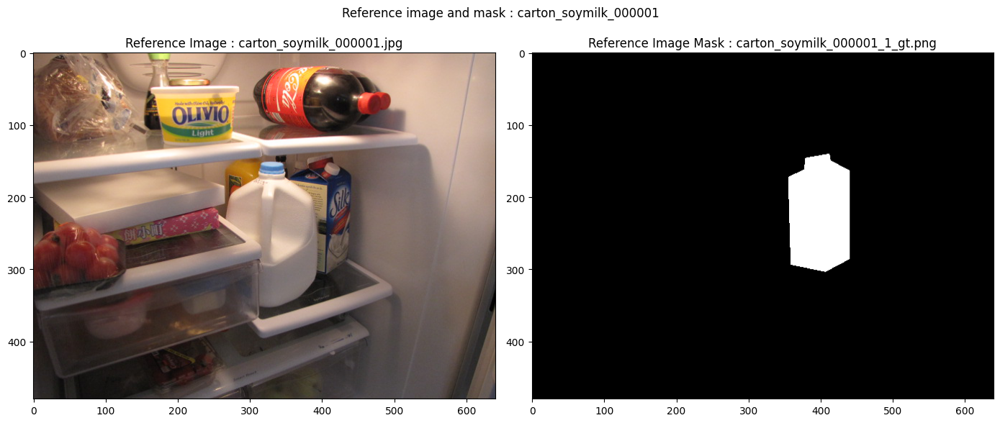

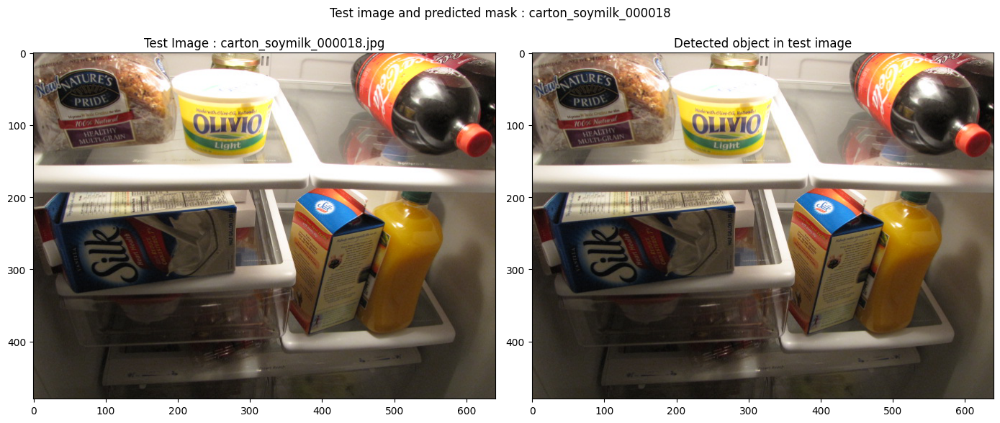

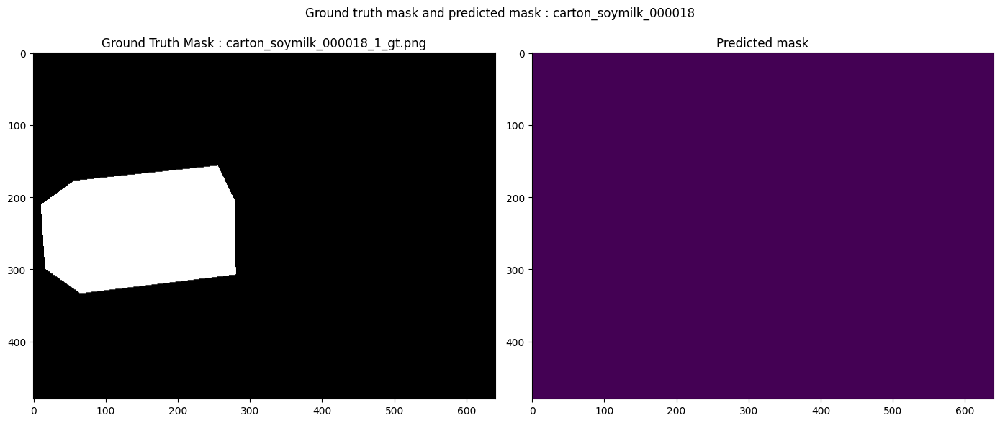

Could not detect object in test image.


In [15]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'carton_soymilk'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.77it/s]


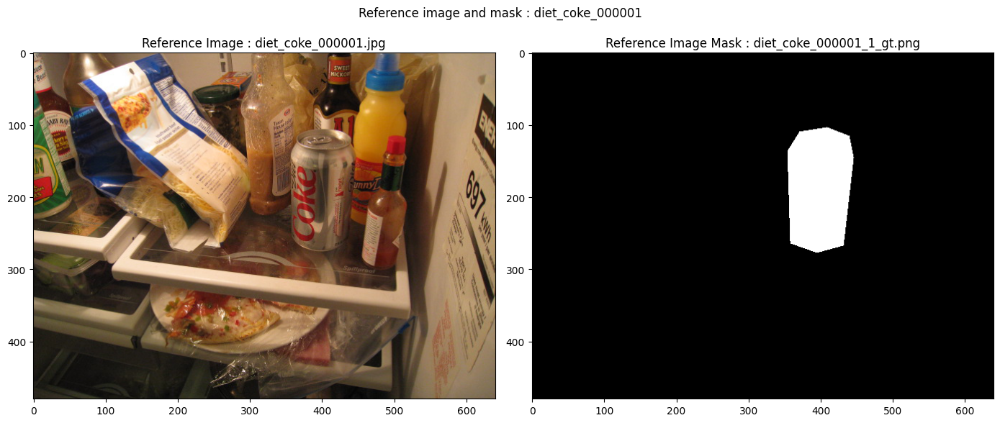

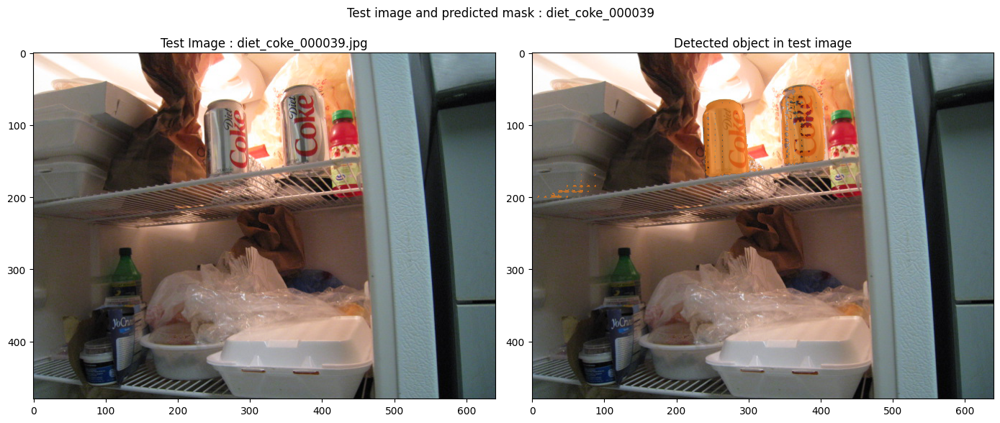

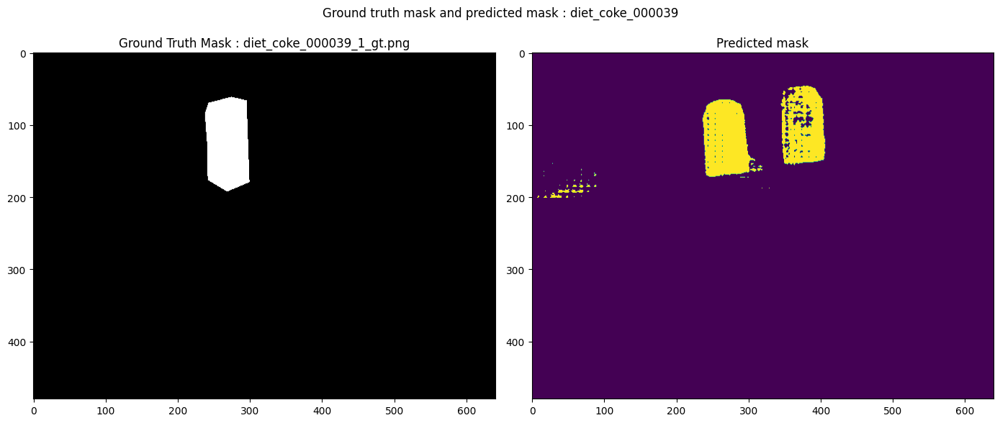

diet_coke_39 has IOU : 0.0


In [16]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'diet_coke'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.38it/s]


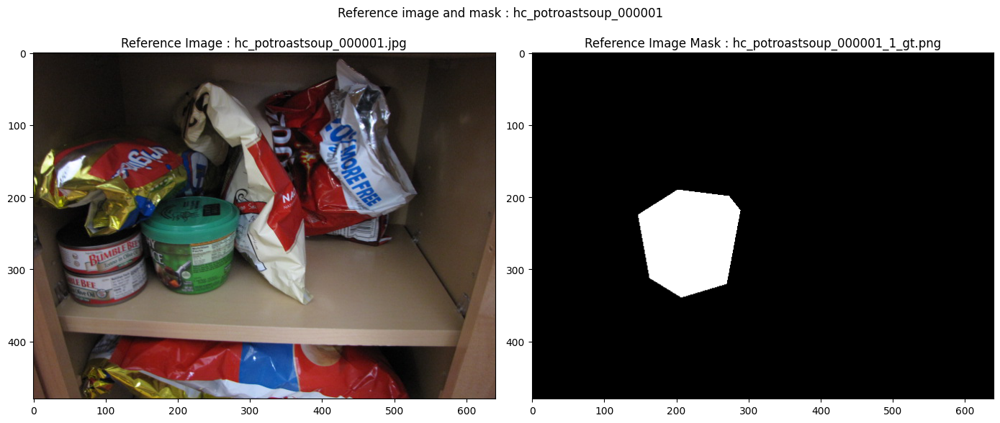

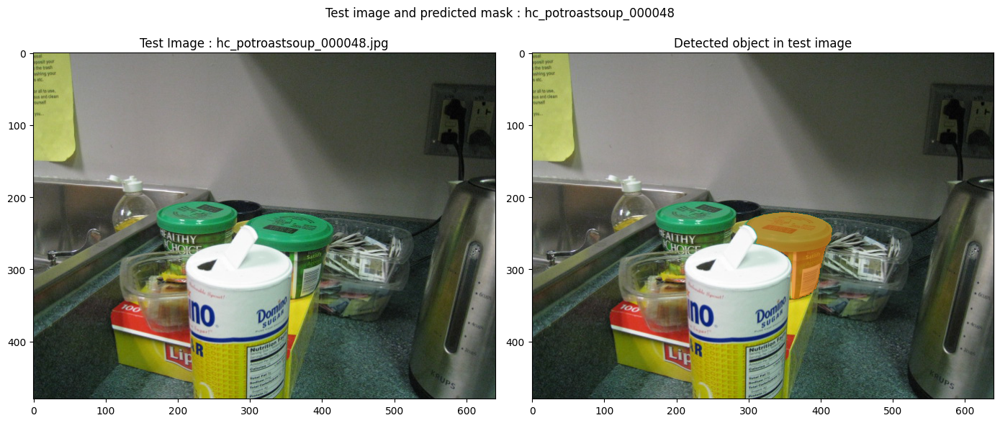

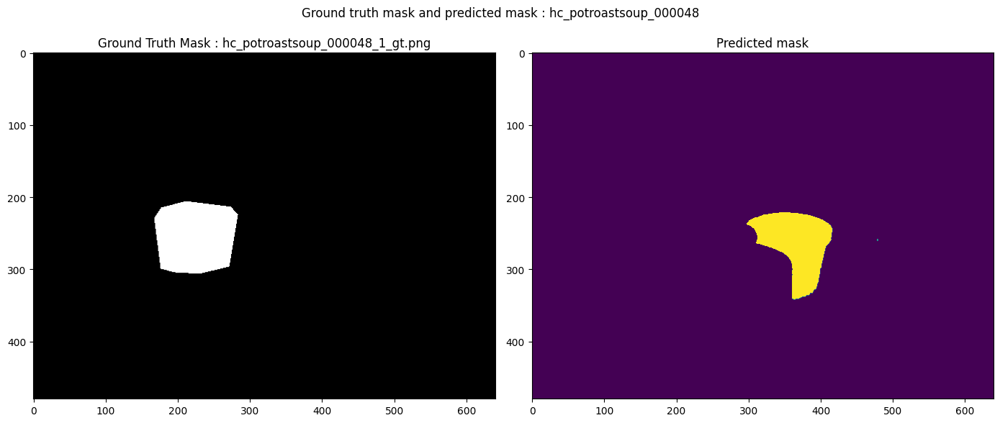

hc_potroastsoup_48 has IOU : 0.0


In [17]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'hc_potroastsoup'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.79it/s]


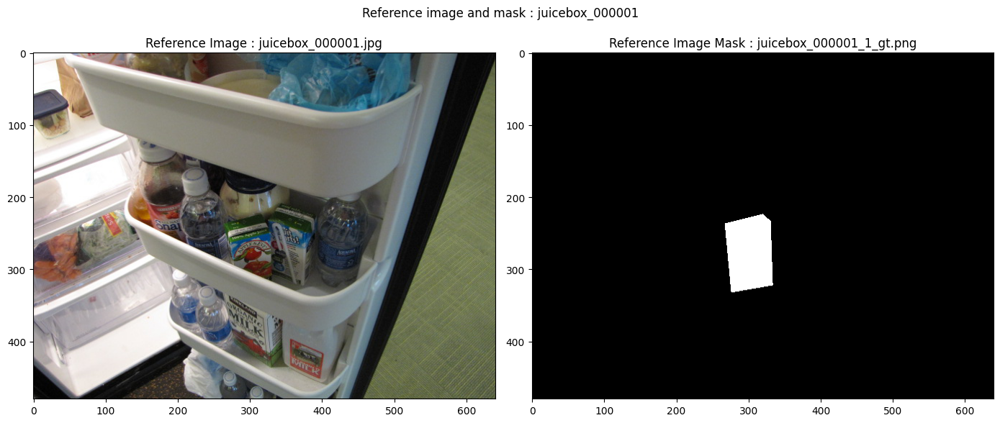

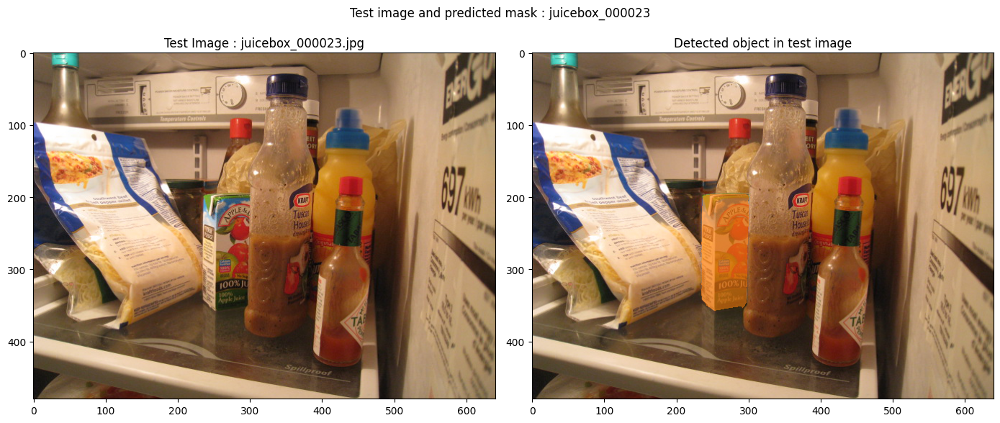

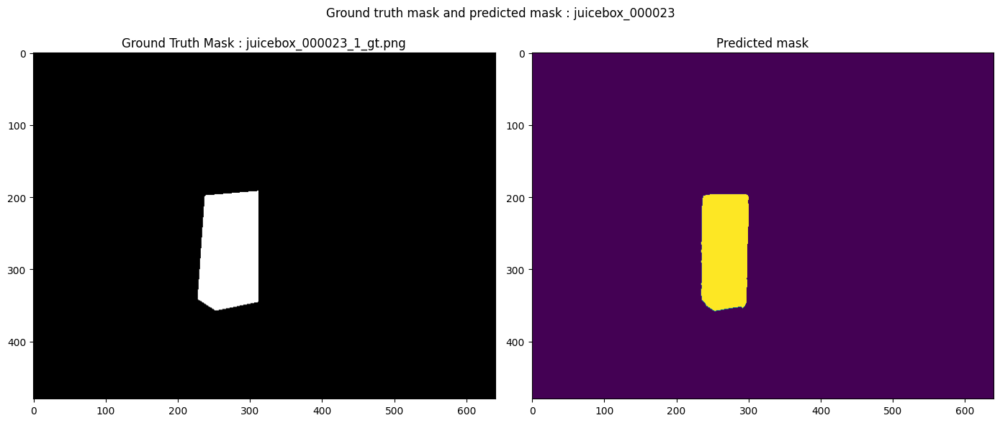

juicebox_23 has IOU : 0.7610433319310055


In [18]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'juicebox'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s]


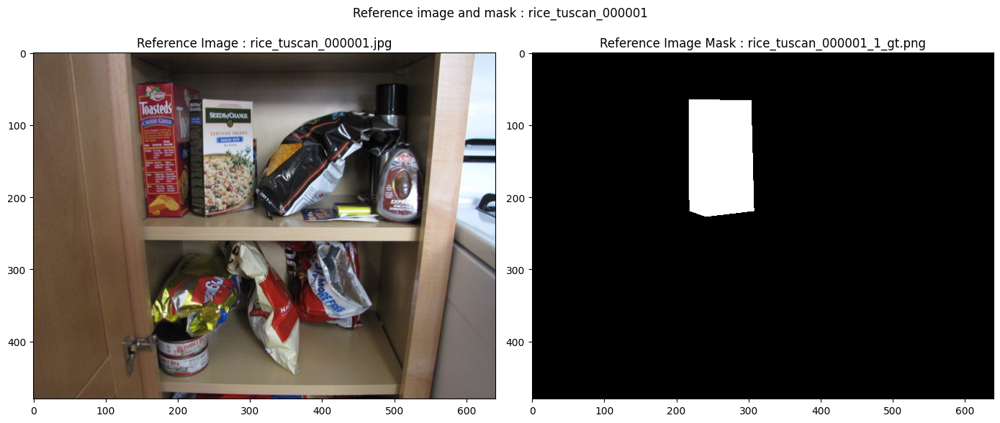

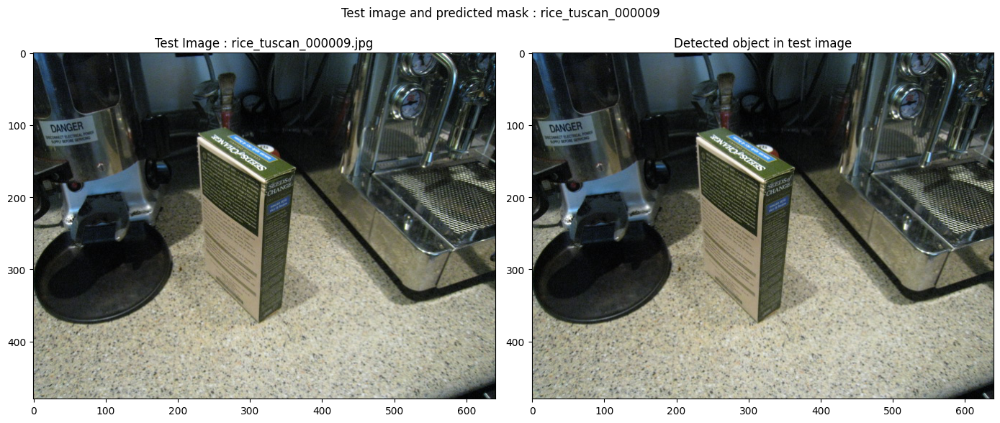

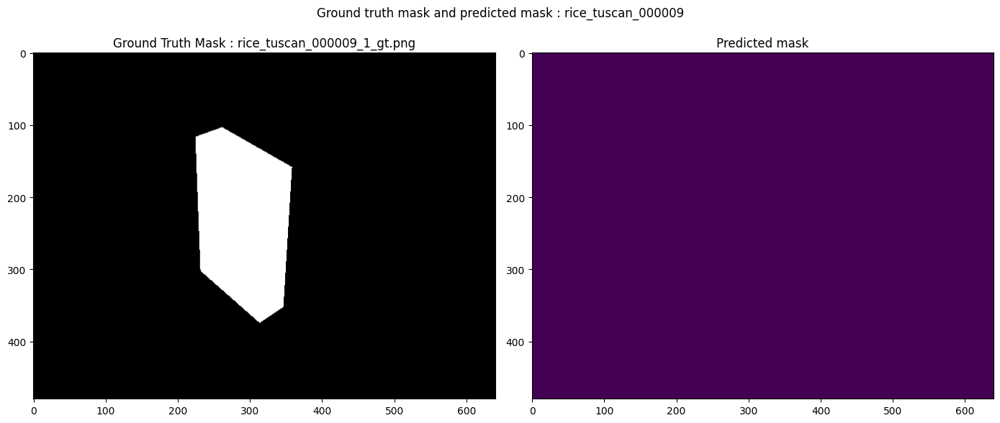

Could not detect object in test image.


In [19]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'rice_tuscan'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.62it/s]


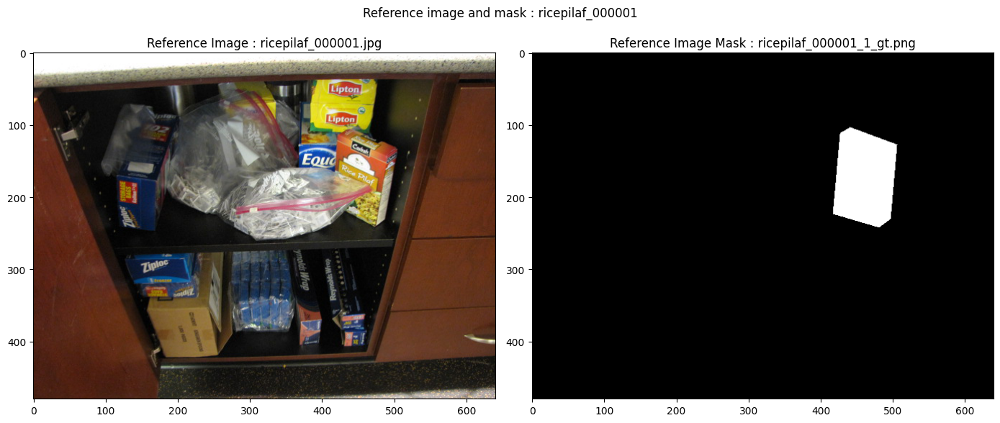

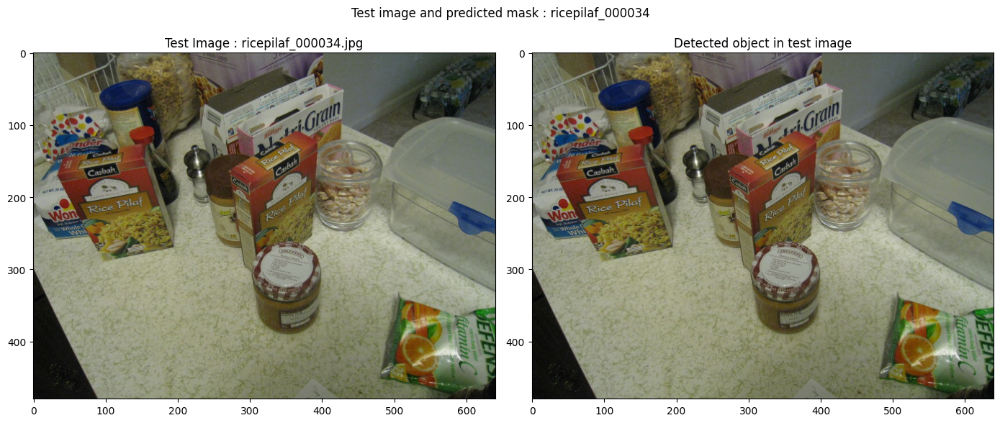

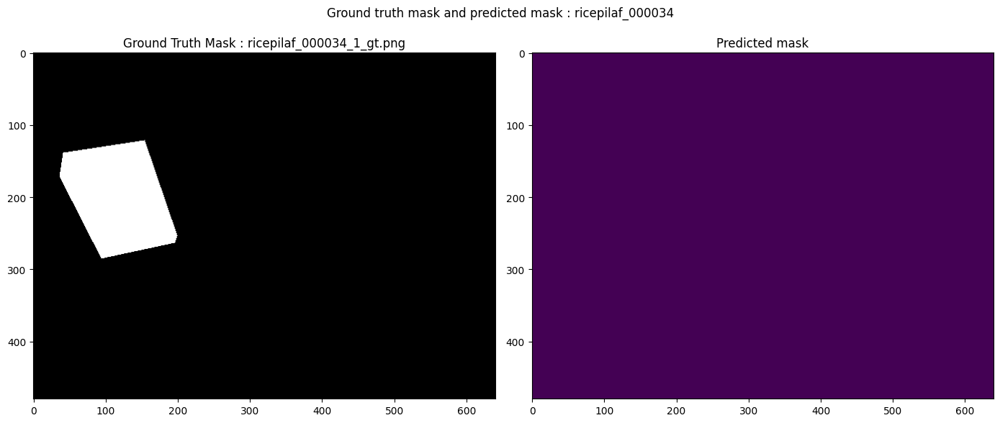

Could not detect object in test image.


In [20]:
# a few more examples for each object type

# select an object type from ['can_chowder','can_soymilk','can_tomatosoup',
# 'carton_oj','carton_soymilk','diet_coke','hc_potroastsoup','juicebox',
# 'rice_tuscan','ricepilaf']
object_type = 'ricepilaf'

# select test object id number from (2-50)
test_object_id_number = np.random.randint(2,51)

try:
    final_output(object_type,test_object_id_number)
except:
    print("Could not detect object in test image.")